# Visão Computacional - Introdução ao espaço de cores e lidando com imagens

## 1. Bibliotecas essenciais e suas versões

Todas as bibliotecas já estão instaladas no Google Colab.

* OpenCV >= 3.4.3
* Matplotlib >= 3.1.3
* Seaborn >= 0.0.10
* Numpy >= 1.18.1


Vamos agora posicionar o diretório do repositório para a aula respectiva. Nesse caso envie o comando de mudança de diretório.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cv2

# Exibição na mesma tela do Jupyter
%matplotlib inline

plt.style.use("seaborn")
sns.set_style("whitegrid", {"axes.grid" : False})

## 2. Trabalhando com imagens

Carregando uma imagem previamente existente

In [2]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('Usuario fez upload da imagem "{name}" com tamanho {length} bytes'.format(name=fn, length=len(uploaded[fn])))

Saving blue-man-group.jpg to blue-man-group.jpg
Saving russia.jpg to russia.jpg
Saving seven.jpg to seven.jpg
Saving tv-image-test.png to tv-image-test.png
Saving willy-wonka.jpg to willy-wonka.jpg
Usuario fez upload da imagem "blue-man-group.jpg" com tamanho 79647 bytes
Usuario fez upload da imagem "russia.jpg" com tamanho 596816 bytes
Usuario fez upload da imagem "seven.jpg" com tamanho 170472 bytes
Usuario fez upload da imagem "tv-image-test.png" com tamanho 5405 bytes
Usuario fez upload da imagem "willy-wonka.jpg" com tamanho 311255 bytes


In [31]:
imagem = cv2.imread("russia.jpg", cv2.IMREAD_COLOR)

print("comprimento (w): %d pixels" % (imagem.shape[1]))
print("altura (h): %d pixels" % (imagem.shape[0]))
print("canais: %d" % (imagem.shape[2]))

comprimento (w): 1536 pixels
altura (h): 1024 pixels
canais: 3


Exibindo uma imagem utilizando o _Matplotlib_. Neste tipo de exibição é obrigatório a conversão do espaço de cores de BGR para RGB.

In [32]:
imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)

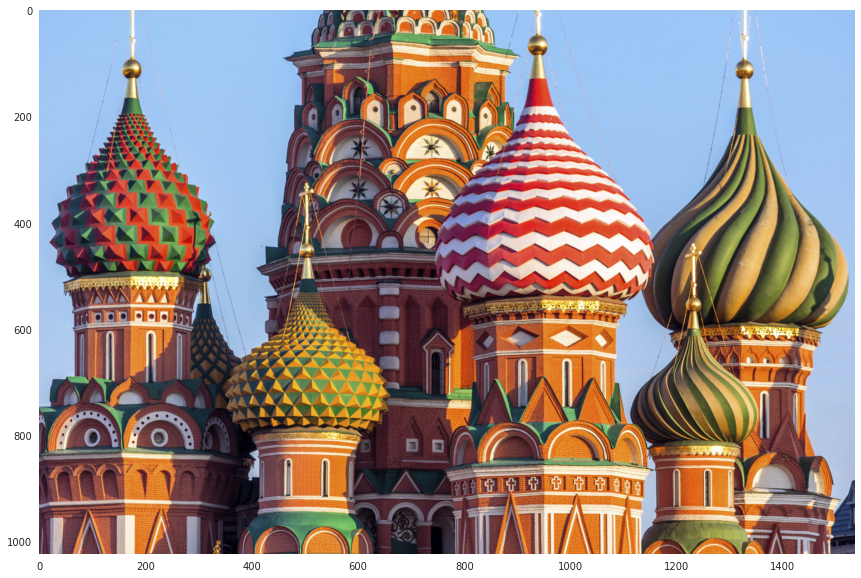

In [33]:
plt.figure(figsize=(20,10))
plt.imshow(imagem)

Escrevendo o objeto image em outro arquivo

In [34]:
cv2.imwrite("russian_2.jpg", imagem)

True

## 2. Espaço de cores

Espaços de cores são a forma como as imagens são organizados nas matrizes. Existem diversos espaços para diferentes finalidades, como escala de cinza que reduz a dimensionalidade sem perder características de gradientes e formas, RGB mantém cores separadas por canais independentes da mesma forma que o HSV, porém este último, organiza as cores de uma forma que combina a cor, sua intensidade e luminosidade.

### 2.1 RGB

A representação da imagem aberta é (1536, 1028, 3), sendo o último parâmetro o número de canais, um para cada cor do RGB.

In [35]:
(r, g, b) = imagem[0, 0]
print("Pixel at (0, 0) - Red: %d, Green: %d, Blue: %d" % (r, g, b))

Pixel at (0, 0) - Red: 152, Green: 194, Blue: 244


In [36]:
imagem[0:50, 0:50] = (0, 0, 255)
(r, g, b) = imagem[0, 0]
print("Pixel at (0, 0) - Red: %d, Green: %d, Blue: %d" % (r, g, b))

Pixel at (0, 0) - Red: 0, Green: 0, Blue: 255


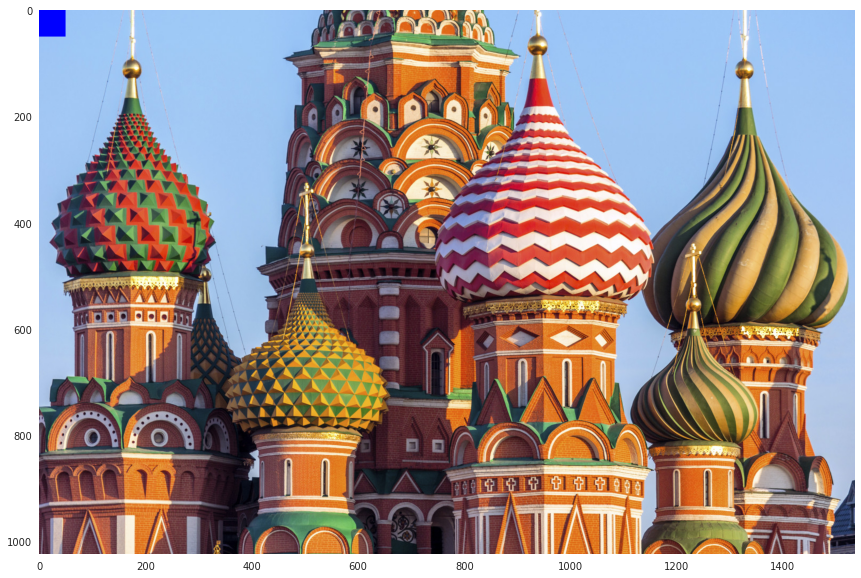

In [37]:
plt.figure(figsize=(20,10))
plt.imshow(imagem)

### 2.2 Escala de cinza

Conversão de uma imagem em escala de cinza

In [38]:
imagem_gray = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)

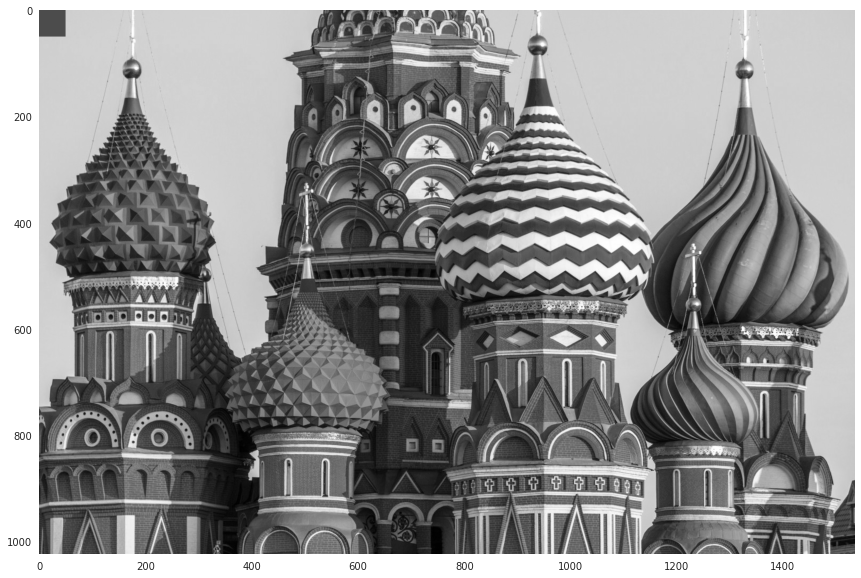

In [39]:
plt.figure(figsize=(20,10))
plt.imshow(imagem_gray, cmap = "gray")

In [40]:
g = imagem_gray[0, 0]
print("Pixel at (0, 0) - Grayscale: %d" % (g))

Pixel at (0, 0) - Grayscale: 76


In [41]:
imagem_gray.shape

(1024, 1536)

In [42]:
imagem.shape

(1024, 1536, 3)

In [43]:
r, g, b = cv2.split(imagem)

Text(0.5, 1.0, 'Russia RGB')

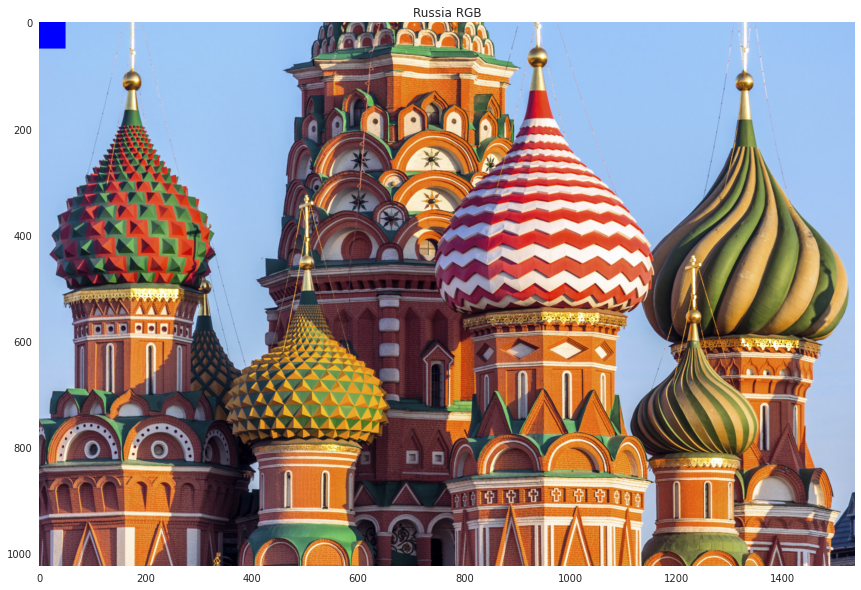

In [44]:
plt.figure(figsize=(20,10))
plt.imshow(imagem)
plt.title("Russia RGB")

Text(0.5, 1.0, 'Russia Blue')

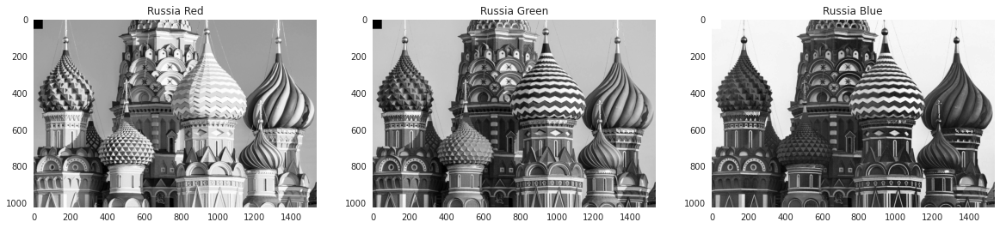

In [45]:
plt.figure(figsize=(20,20))

#Composição Vermelha
plt.subplot(1,3,1)
plt.imshow(r, cmap = "gray")
plt.title("Russia Red")

#Composição Verde
plt.subplot(1,3,2)
plt.imshow(g, cmap = "gray")
plt.title("Russia Green")

#Composição Azul
plt.subplot(1,3,3)
plt.imshow(b, cmap = "gray")
plt.title("Russia Blue")

Utilizando a função merge para combinar as componentes de cores e trazer sua visualização original.

*Referência documentação do [OpenCV](https://docs.opencv.org/3.1.0/d3/df2/tutorial_py_basic_ops.html).*

In [46]:
r, g, b = cv2.split(imagem)
imagem_vazia = np.zeros(imagem.shape[:2], dtype=np.uint8)

Text(0.5, 1.0, 'Russia Blue')

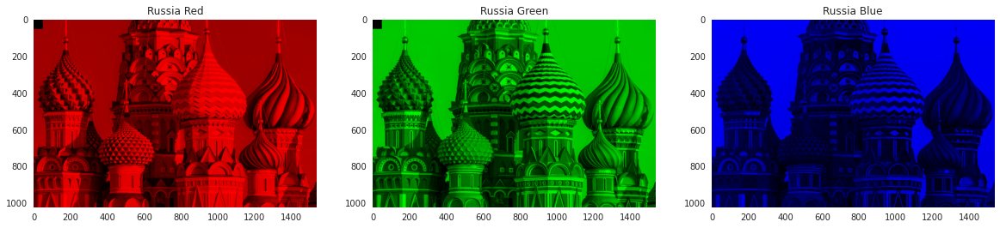

In [47]:
plt.figure(figsize=(20,20))

plt.subplot(1,3,1)
plt.imshow(cv2.merge([r, imagem_vazia, imagem_vazia]))
plt.title("Russia Red")

plt.subplot(1,3,2)
plt.imshow(cv2.merge([imagem_vazia, g, imagem_vazia]))
plt.title("Russia Green")

plt.subplot(1,3,3)
plt.imshow(cv2.merge([imagem_vazia, imagem_vazia, b]))
plt.title("Russia Blue")

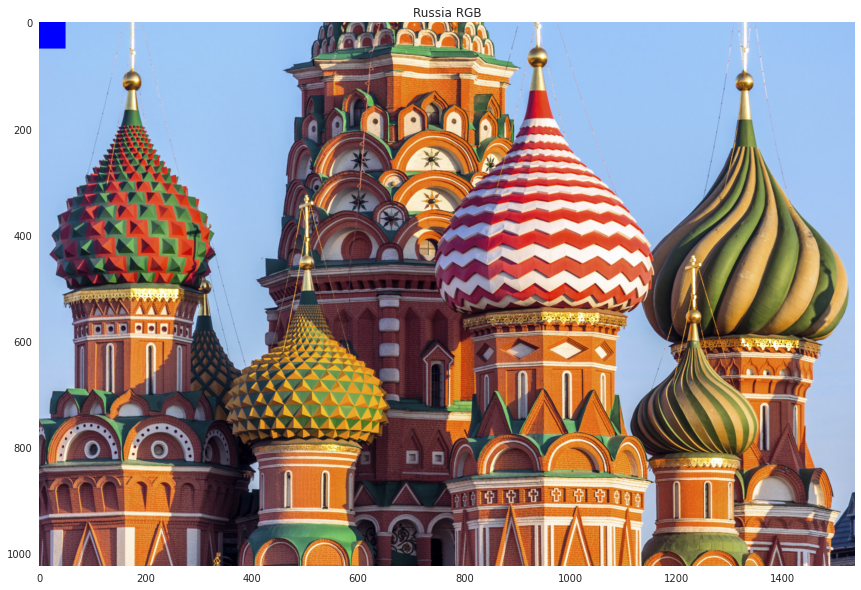

In [48]:
imagem_merged = cv2.merge([r, g, b])

plt.figure(figsize=(20,10))
plt.title("Russia RGB")
plt.imshow(imagem_merged)

In [49]:
r, g, b = cv2.split(imagem)

Uma vez que é possível separar cada componente de imagem, também podemos interagir com estes valores para aumentar a intensidade de cada componente.
Note que isso pode resultar em saturações, que é quando um determinado pixel atinge seu valor máximo.

Text(0.5, 1.0, 'Intensificado Vermelho')

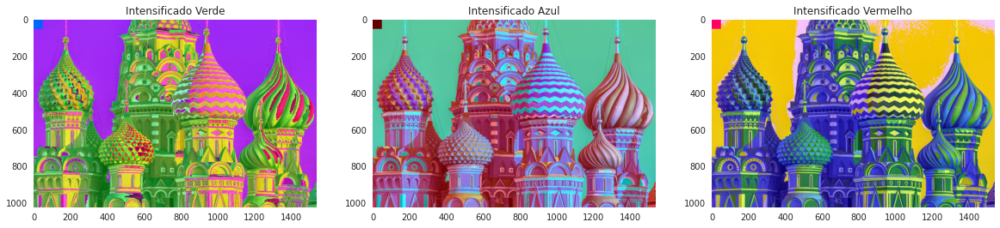

In [50]:
plt.figure(figsize=(20,20))

#Intensificando o componente verde da imagem
plt.subplot(1,3,1)
plt.imshow(cv2.merge([r, g+100, b]))
plt.title("Intensificado Verde")

#Intensificando o componente azul da imagem
plt.subplot(1,3,2)
plt.imshow(cv2.merge([b+100, g, r]))
plt.title("Intensificado Azul")

#Intensificando o componente vermelho da imagem
plt.subplot(1,3,3)
plt.imshow(cv2.merge([b, g, r+100]))
plt.title("Intensificado Vermelho")

### 2.3 HSV

Manipulando imagem no espaço HSV

In [51]:
imagem_hsv = cv2.cvtColor(imagem, cv2.COLOR_BGR2HSV)

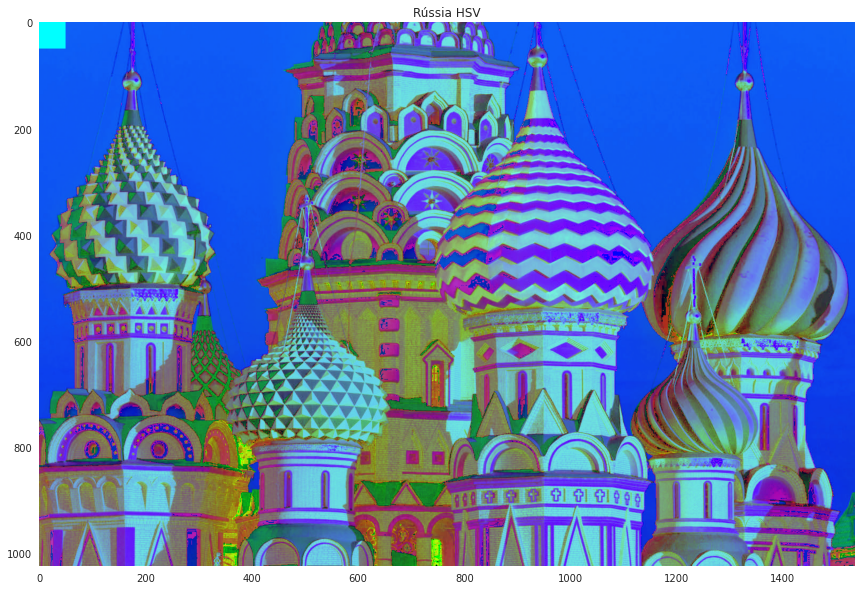

In [52]:
plt.figure(figsize=(20,10))
plt.title("Rússia HSV")
plt.imshow(imagem_hsv)

Text(0.5, 1.0, 'Russia Hue (Matiz)')

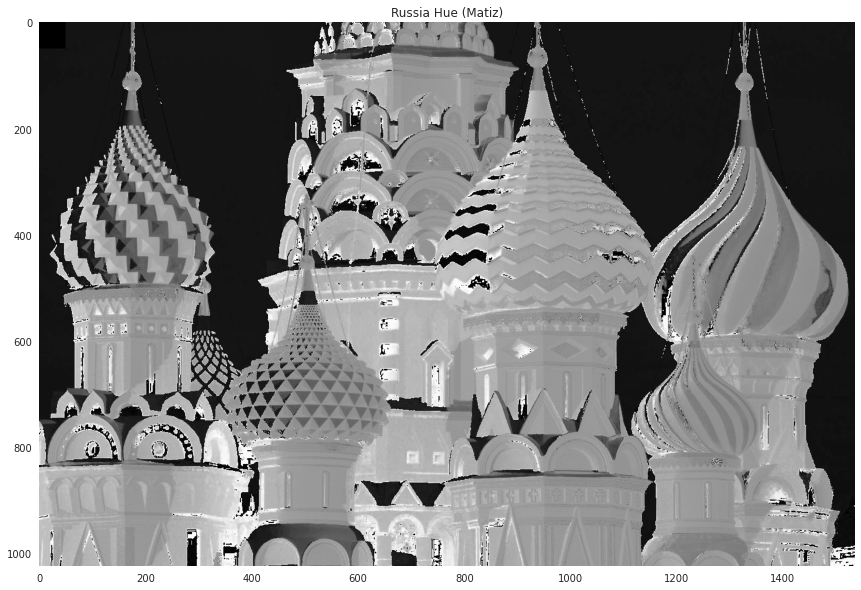

In [53]:
plt.figure(figsize=(20,10))
plt.imshow(imagem_hsv[:,:,0], cmap="gray")
plt.title("Russia Hue (Matiz)")

Text(0.5, 1.0, 'Russia Saturation (Saturação)')

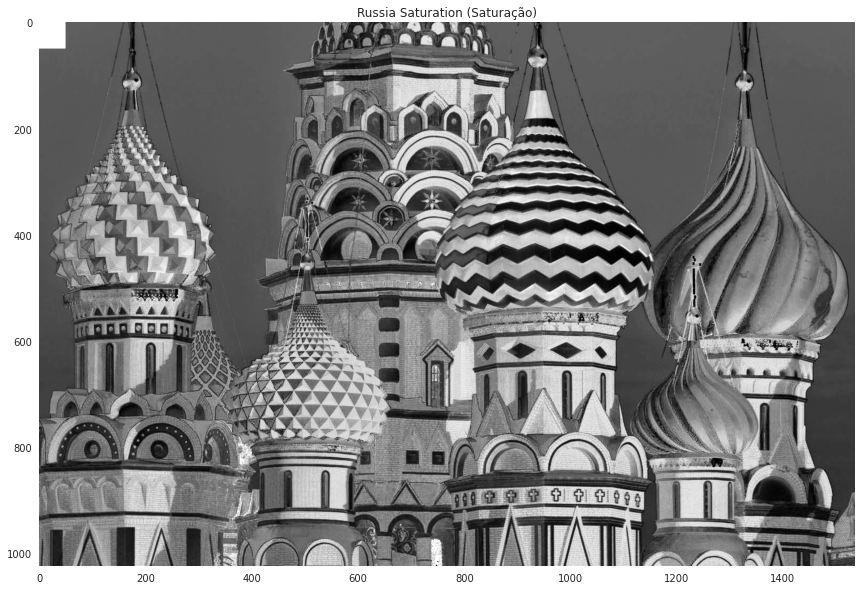

In [54]:
plt.figure(figsize=(20,10))
plt.imshow(imagem_hsv[:,:,1], cmap="gray")
plt.title("Russia Saturation (Saturação)")

Text(0.5, 1.0, 'Russia Value (Brilho)')

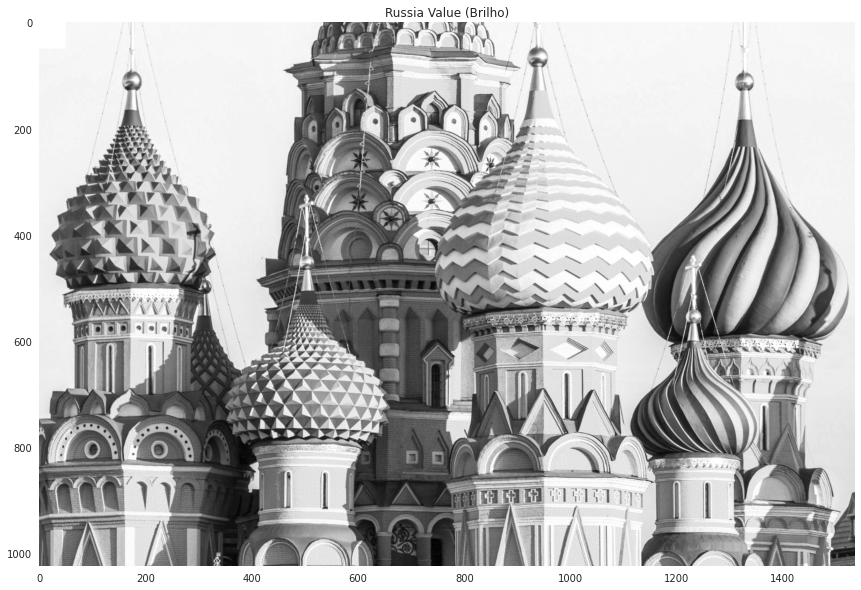

In [55]:
plt.figure(figsize=(20,10))
plt.imshow(imagem_hsv[:,:,2], cmap="gray")
plt.title("Russia Value (Brilho)")

Manipulando imagem no espaço RGB

*A função split separa de uma imagem RGB (ou BGR) suas componetnes R, G e B.*

## 3. Histogramas

In [56]:
imagem_blue_man = cv2.imread("blue-man-group.jpg", cv2.IMREAD_COLOR)
imagem_blue_man = cv2.cvtColor(imagem_blue_man, cv2.COLOR_BGR2RGB)

Text(0.5, 1.0, 'Blue Man Group')

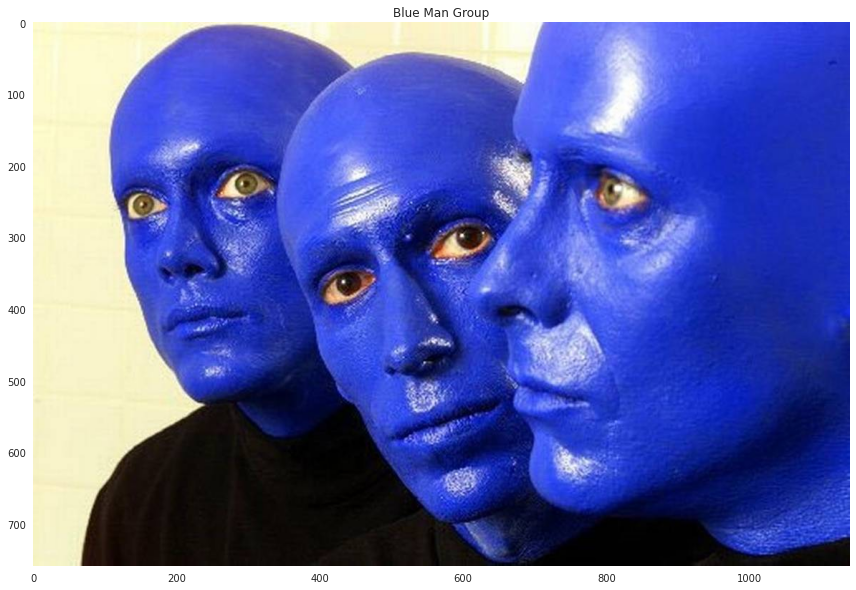

In [57]:
plt.figure(figsize=(20,10))
plt.imshow(imagem_blue_man)
plt.title("Blue Man Group")

Definindo um dicionário dos componentes de cores para ser utilizado nas funções de histograma.

In [58]:
cores = {"r": 0, "g": 1, "b": 2}

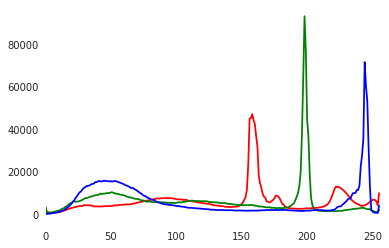

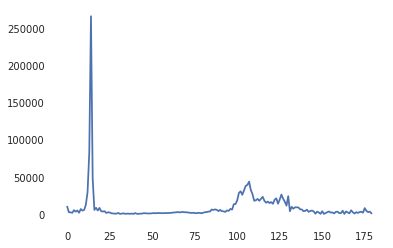

In [59]:
def histograma_bgr(imagem):
    for cor in cores:
        histograma = cv2.calcHist([imagem],[cores[cor]],None,[256],[0,256])
        plt.plot(histograma,color = cor)
        plt.xlim([0,256])
    plt.show()

def histograma_hue(imagem_hsv):
    imagem_hsv = cv2.cvtColor(imagem_hsv, cv2.COLOR_BGR2HSV)
    histograma_hue = cv2.calcHist([imagem_hsv], [0], None, [180], [0, 180])
    plt.plot(histograma_hue)
    plt.show() 

histograma_bgr(imagem)
histograma_hue(imagem)

Reparem que em imagens mais escuras, o histograma correspondente vai indicar menor concentração nos valores maiores, ficando sempre próximo de zero.

Text(0.5, 1.0, 'Seven')

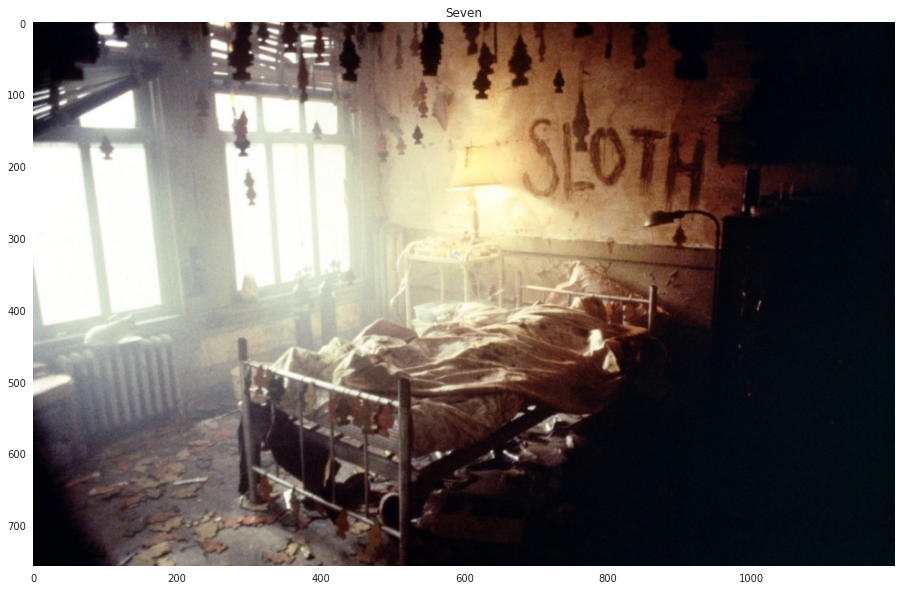

In [60]:
imagem_seven = cv2.imread("seven.jpg", cv2.IMREAD_COLOR)
imagem_seven = cv2.cvtColor(imagem_seven, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,10))
plt.imshow(imagem_seven)
plt.title("Seven")

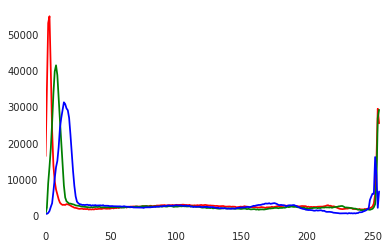

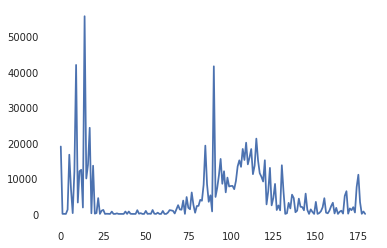

In [61]:
histograma_bgr(imagem_seven)
histograma_hue(imagem_seven)

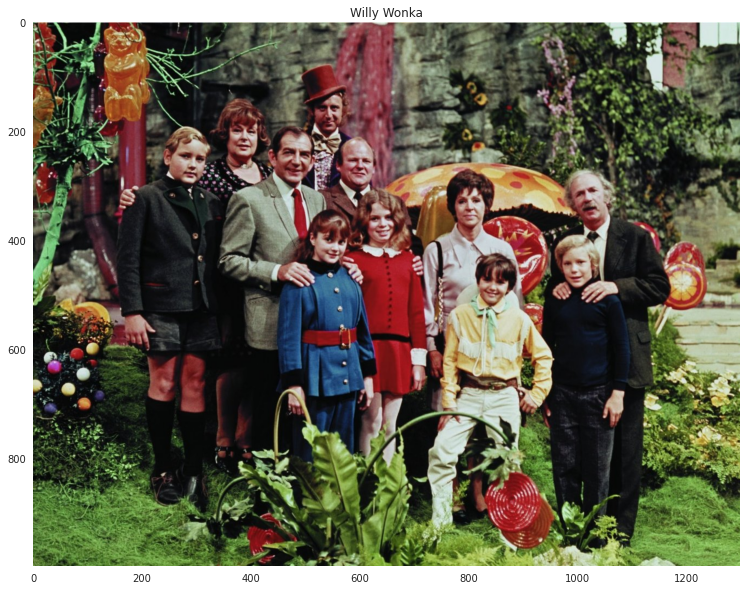

In [62]:
imagem_willy_wonka = cv2.imread("willy-wonka.jpg", cv2.IMREAD_COLOR)
imagem_willy_wonka = cv2.cvtColor(imagem_willy_wonka, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,10))
plt.imshow(imagem_willy_wonka)
plt.title("Willy Wonka")
plt.show()

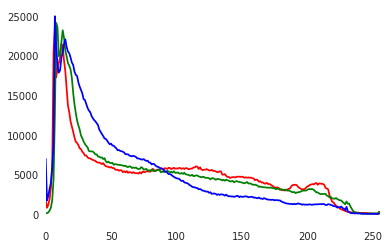

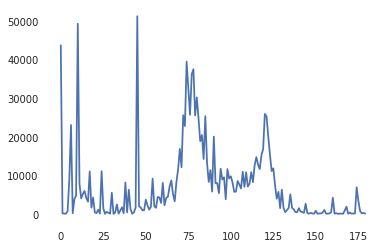

In [63]:
histograma_bgr(imagem_willy_wonka)
histograma_hue(imagem_willy_wonka)

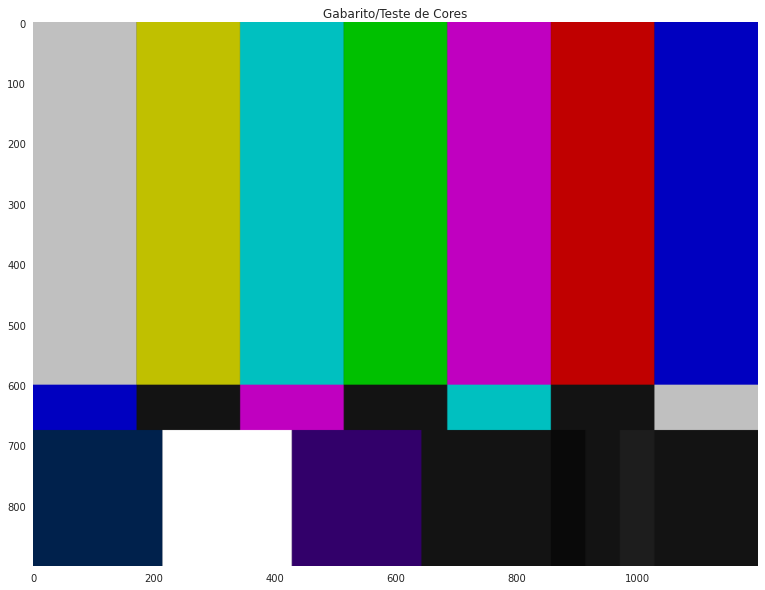

In [64]:
imagem_teste_cores = cv2.imread("tv-image-test.png", cv2.IMREAD_COLOR)
imagem_teste_cores = cv2.cvtColor(imagem_teste_cores, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,10))
plt.imshow(imagem_teste_cores)
plt.title("Gabarito/Teste de Cores")
plt.show()

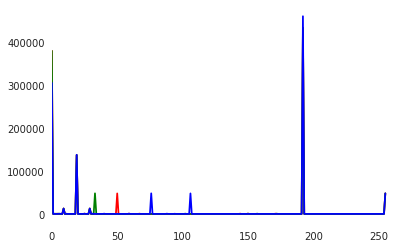

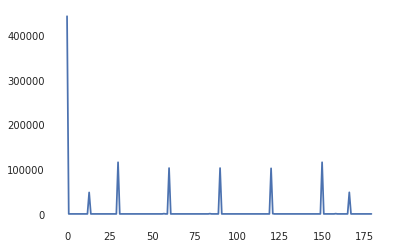

In [65]:
histograma_bgr(imagem_teste_cores)
histograma_hue(imagem_teste_cores)

## 4. Construção de imagens 

### 4.1 Formas geométricas e textos

Desenhando um painel em branco. Uma imagem em branco é considerada ausente de pixels, logo seu aspecto gráfico é preto.

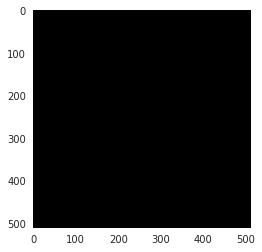

In [66]:
imagem_color = np.zeros((512, 512, 3), np.uint8)

plt.imshow(imagem_color)

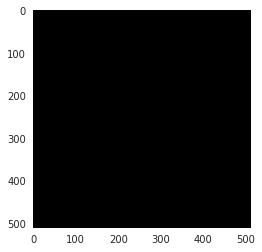

In [67]:
imagem_grayscale = np.zeros((512, 512), np.uint8)

plt.imshow(imagem_grayscale, cmap="gray")

### Desenhando uma linha

A função ```line``` recebe como parâmetros de entrada a imagem, as coordenadas (x,y) de início, fim, cor em RGB e espessura da linha.

Text(0.5, 1.0, 'Linha')

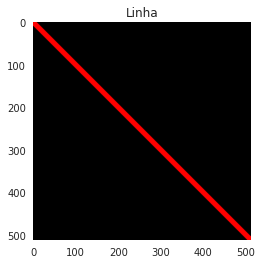

In [68]:
imagem_color = np.zeros((512, 512, 3), np.uint8)
cv2.line(imagem_color,(0,0), (511,511), (255, 0, 0), 10)

plt.imshow(imagem_color)
plt.title("Linha")

### Desenhando um quadrado ou retângulo

A funçao ```rectangle``` recebe como parâmetros de entrada a imagem, as coordenadas do vértice de início, do vértice oposto, cor em RGB e espessura da linha.

Text(0.5, 1.0, 'Retângulo')

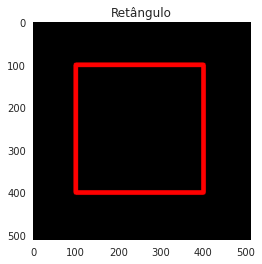

In [69]:
imagem_color = np.zeros((512, 512, 3), np.uint8)
cv2.rectangle(imagem_color,(100,100), (400,400), (255, 0, 0), 10)

plt.imshow(imagem_color)
plt.title("Retângulo")

### Desenhando um quadrado ou retângulo com cores invertidas

Neste caso, a espessura é alterada para o valor ```-1```.

Text(0.5, 1.0, 'Retângulo Invertido')

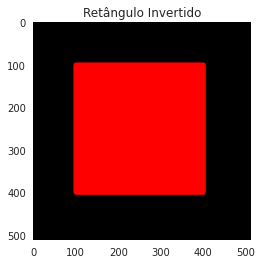

In [70]:
image_color = np.zeros((512, 512, 3), np.uint8)
cv2.rectangle(imagem_color,(100,100), (400,400), (255, 0, 0), -1)

plt.imshow(imagem_color)
plt.title("Retângulo Invertido")

### Desenhando círculos

A função ```circle``` recebe como parâmetros de entrada a imagem, origem do círculo, raio, cor em RGB e espessura da linha.

Text(0.5, 1.0, 'Círculo')

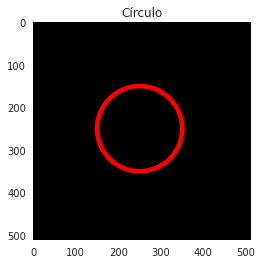

In [71]:
imagem_color = np.zeros((512, 512, 3), np.uint8)
cv2.circle(imagem_color,(250,250), 100, (255, 0, 0), 10)

plt.imshow(imagem_color)
plt.title("Círculo")

Text(0.5, 1.0, 'Círculo Preenchido')

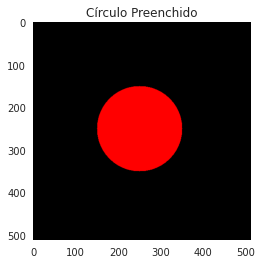

In [72]:
imagem_color = np.zeros((512, 512, 3), np.uint8)
cv2.circle(imagem_color,(250,250), 100, (255, 0, 0), -1)

plt.imshow(imagem_color)
plt.title("Círculo Preenchido")

### Desenhando polígonos.

A função ```polylines``` recebe como parâmetros de entrada a imagem, as coordenadas (x,y) de cada vértice do polígono, valor booleano par polígono aberto ou fechado, cor em RGB e espessura da linha.

Text(0.5, 1.0, 'Polígonos')

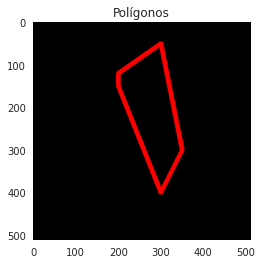

In [73]:
imagem_color = np.zeros((512, 512, 3), np.uint8)

pts = np.array([[200,120], [300,50], [350,300], [300,400], [200,150]], np.int32)

cv2.polylines(imagem_color, [pts], True, (255, 0, 0), 10)

plt.imshow(imagem_color)
plt.title("Polígonos")

Text(0.5, 1.0, 'Polígonos')

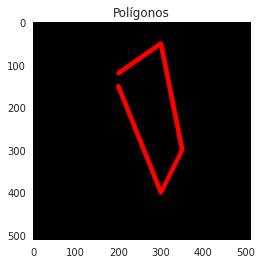

In [74]:
imagem_color = np.zeros((512, 512, 3), np.uint8)

pts = np.array( [[200,120], [300,50], [350,300], [300,400], [200,150]], np.int32)

cv2.polylines(imagem_color, [pts], False, (255, 0, 0), 10)

plt.imshow(imagem_color)
plt.title("Polígonos")

A função ```fillPolly``` recebe como parâmetros de entrada a imagem, as coordenadas (x,y) de cada vértice do polígono e cor em RGB.

Text(0.5, 1.0, 'Polígonos Invertido')

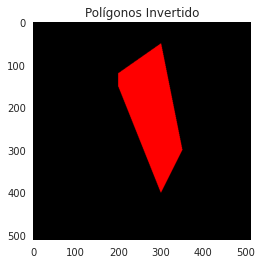

In [75]:
imagem_color = np.zeros((512, 512, 3), np.uint8)

pts = np.array( [[200,120], [300,50], [350,300], [300,400], [200,150]], np.int32)

cv2.fillPoly(imagem_color, [pts], (255, 0, 0))

plt.imshow(imagem_color)
plt.title("Polígonos Invertido")

### Texto em imagens

Inserindo textos em uma imagem. As fontes disponíveis não suporta caracteres especiais (UTF-8) como acentos. Se isto for um problema deve-se olhar para outras bibliotecas que podem fazer este trabalho um pouco melhor como o PIL.

A função ```putText``` recebe como parâmetro de entrada a imagem, o texto, as coordenadas (x,y), a fonte, o tamanho da fonte, a cor em RGB e a espessura da linha

Text(0.5, 1.0, 'Texto')

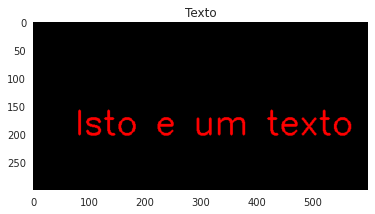

In [76]:
imagem_color = np.zeros((300, 600, 3), np.uint8)
cv2.putText(imagem_color, "Isto e um texto :)", (75,200), cv2.FONT_HERSHEY_SIMPLEX, 2, (255, 0, 0), 3)

plt.imshow(imagem_color)
plt.title("Texto")